In [1]:
from IPython.display import display, HTML

display(HTML("<style>.container { width:80% !important; }</style>"))

In [21]:
# import black
# import jupyter_black

# jupyter_black.load(
#     lab=False,
#     line_length=100,
#     verbosity="DEBUG",
#     target_version=black.TargetVersion.PY310,
# )

# Problema

Lietuvos keliuose yra įrengtos vaizdo kameros, kurios stebi eismą. Ši informacija svetainėje https://eismoinfo.lt/ yra pateikia beveik realiu laiku. Sistemos trūkumas - joje nepateikiama informacija ar nuotraukoje yra fiksuojama transporto priemonė ar ne.

# Užduotis

Sukurti modelį, kuris gebėtų iš eismo stebėjimo įrenginių nuotraukų prognozuoti ar juose vaizduojama transporto priemonė ar ne.

In [3]:
import os
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import ipyplot
import math
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from sklearn import metrics

project_path = "C:\\Users\\jolged\PycharmProjects\\Auto_Recognition\\"

# Duomenys

In [4]:
# Atlikta pirminė duomenų analizė.

In [5]:
# Vaizdo kamerų sąrašas
camera_url = "https://eismoinfo.lt/eismoinfo-backend/camera-info-table/"
cameras = pd.DataFrame(requests.get(camera_url).json())
cameras.head(2)

,id,name,roadName,roadNr,date,image,x,y,km
0,1167,Vilnius,Vilnius–Kaunas–Klaipėda,A1,1684341314000,https://www.eismoinfo.lt/eismoinfo-backend/ima...,576154,6056867,10.04
1,1165,Didžiulio ež.,Vilnius–Kaunas–Klaipėda,A1,1684341315000,https://www.eismoinfo.lt/eismoinfo-backend/ima...,568026,6061414,19.42


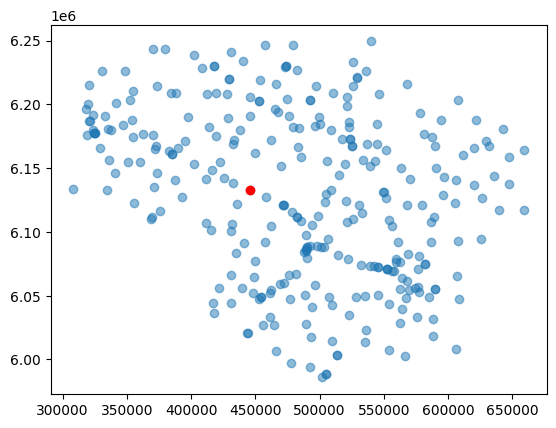

In [6]:
# Vaizdo kamerų išsidėstymas
plt.scatter(cameras["x"], cameras["y"], alpha=0.5)
plt.scatter(cameras[cameras["id"] == 364]["x"], cameras[cameras["id"] == 364]["y"], color="r")
plt.show()

In [7]:
print("Vaizdo kamerų skaičius: ", len(cameras))

Vaizdo kamerų skaičius:  303


In [8]:
# Duomenų surinkimo funkcija
def collect(camera_id, page_range, page_size, make_camera_dir):
    camera_path = collection_path

    if make_camera_dir:
        camera_path = collection_path + f"\\{camera_id}\\"
        os.makedirs(camera_path, exist_ok=True)

    for i in page_range:
        camera_batch = camera_url + f"{camera_id}?pageNumber={i}&pageSize={page_size}"
        response_batch = requests.get(camera_batch)
        if response_batch.status_code == 200:
            for i in range(len(response_batch.json()["info"])):
                response_image = requests.get(response_batch.json()["info"][i]["image"])
                date = response_batch.json()["info"][i]["date"]
                if response_image.status_code == 200:
                    with open(
                        camera_path
                        + str(camera_id)
                        + "_"
                        + datetime.utcfromtimestamp(date / 1000).strftime("%Y-%m-%d_%H%M%S")
                        + "_"
                        + str(response_batch.json()["info"][i]["id"])
                        + ".jpg",
                        "wb",
                    ) as f:
                        f.write(response_image.content)

In [9]:
# Pradinių duomenų surinkimo katalogas
# Paimam kiekvienos kameros paskutinę nuotrauką, kad pažiūrėti koks vaizdas matomas kiekvienoje kameroje

latest_collection_path = project_path + "data\\collection_latest\\"
os.makedirs(latest_collection_path, exist_ok=True)

# for i in cameras['id']:
#     collect(camera_id=i, page_range=range(1), page_size=1, make_camera_dir=False)

In [10]:
print(f"Gauta {len(os.listdir(latest_collection_path))} nuotraukos iš {len(cameras)}")
print(
    f"Negauta nuotraukų iš {len(cameras) - len(os.listdir(latest_collection_path))} vaizdo kamerų"
)

Gauta 282 nuotraukos iš 303
Negauta nuotraukų iš 21 vaizdo kamerų


In [ ]:
# Matome kad kameros fiksuoja tiek kelius tiek automobilių krovimo stoteles
# Taip pat matome, jog tarp gautų nuotraukų yra ir nekokybiškų arba neužfiksuotų kadrų
bad_image_paths = [path for path in image_paths if (path.split("\\")[-1].split("_")[0]) in ["307", "3881"]]
preview_images(bad_image_paths, ncols=6)

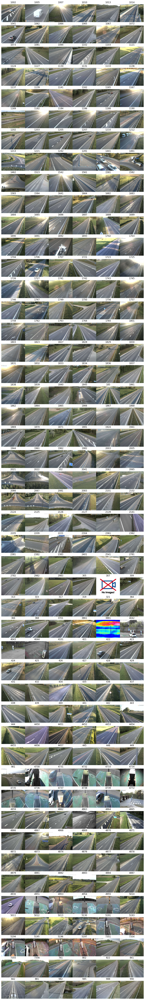

In [12]:
# Peržiūrime nuotraukas
image_paths = [latest_collection_path + pic for pic in os.listdir(latest_collection_path)]
preview_images(image_paths, ncols=6)

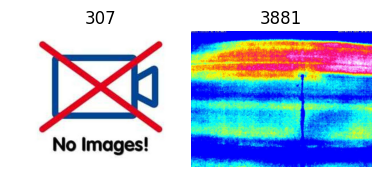

In [13]:
# Matome kad kameros fiksuoja tiek kelius tiek automobilių krovimo stoteles
# Taip pat matome, jog tarp gautų nuotraukų yra ir nekokybiškų arba neužfiksuotų kadrų
bad_image_paths = [path for path in image_paths if (path.split('\\')[-1].split('_')[0]) in ['307', '3881']]
preview_images(bad_image_paths, ncols=6)

In [14]:
# Duomenų surinkimo katalogas
collection_path = project_path + '\\data\\collection\\'

# Atsitiktiniu būdu pasirinkau kamerą 364 ir surinkau duomenis ta pačia duomenų surunkimo funkcija
# collect(camera_id=364, page_range=range(30), page_size=30)

# I Bandymas

In [ ]:
data_version = "v1.1.0"
train_dataset_path = project_path + f"data\\{data_version}\\train"
test_dataset_path = project_path + f"data\\{data_version}\\test"

model_name_try1 = f"model_{data_version}_try1.hdf5"

model_path_try1 = project_path + f"models\\model_{data_version}_try1\\"
os.makedirs(model_path_try1, exist_ok=True)
model_outputs_try1 = model_path_try1 + "outputs\\"
os.makedirs(model_outputs_try1, exist_ok=True)

model_metrics = [
    "accuracy",
    "Precision",
    "Recall",
    "AUC",
    "FalseNegatives",
    "FalsePositives",
    "TrueNegatives",
    "TruePositives",
]

In [ ]:
def file_count(str_text, path):
    count = 0
    for root_dir, cur_dir, files in os.walk(path):
        count += len(files)
    print(str_text, "dataset file count:", count)


# Pavyzdžių kiekis kiekviename masyve
file_count("Train", train_dataset_path)
file_count("Test", test_dataset_path)

In [ ]:
# Kiekvieno masyvo pavyzdžių klasių skaičiai
[file_count('Train: '+a, train_dataset_path+'\\'+a) for a in os.listdir(train_dataset_path)]
[file_count('Test: '+a, test_dataset_path+'\\'+a) for a in os.listdir(train_dataset_path)]

In [16]:
# Treniravimo duomenys
train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
train_data = train_datagen.flow_from_directory(train_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary")


# Testavimo duomenys
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
test_data = test_datagen.flow_from_directory(test_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary", shuffle=False)

Found 701 images belonging to 2 classes.
Found 156 images belonging to 2 classes.


## Modelis

In [ ]:
# Modelio aprašymas
model_try1 = tf.keras.Sequential(
    [
        layers.Conv2D(
            128, (3, 3), activation="relu", input_shape=(224, 224) + (3,)
        ),
        layers.Conv2D(128, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),
        layers.Conv2D(64, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),
        layers.Conv2D(32, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(1, activation="sigmoid"),
    ]
)

checkpoint = keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(model_path_try1, model_name_try1),
    save_best_only=True,
    mode=min,
)

# Kompiliavimas
model_try1.compile(
    loss="binary_crossentropy",
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=model_metrics,
)

In [20]:
model_try1.summary()

NameError: name 'model_try1' is not defined

In [ ]:
# # Treniravimas
# history = model_try1.fit(
#     train_data,
#     validation_data=test_data,
#     epochs=30,
#     callbacks=[checkpoint]
# )

# pd.DataFrame(history.history).to_excel(model_outputs_try1+'\\history.xlsx')

# Rezultatai

In [ ]:
model_history_try1 = pd.read_excel(model_outputs_try1 + "history.xlsx", index_col="Unnamed: 0")
model_history_try1.columns

In [ ]:
def plot_metrics(df, path):
    fig = plt.figure(figsize=(15, 6))

    ax = fig.add_subplot(221)
    ax.title.set_text("Model Loss")
    ax.plot(df["loss"], label="train")
    ax.plot(df["val_loss"], label="test")
    ax.legend()

    ax = fig.add_subplot(222)
    ax.title.set_text("Model Accuracy")
    ax.plot(df["accuracy"], label="train")
    ax.plot(df["val_accuracy"], label="test")
    ax.legend()

    ax = fig.add_subplot(223)
    ax.title.set_text("Model Precision")
    ax.plot(df["precision"], label="train")
    ax.plot(df["val_precision"], label="test")
    ax.legend()

    ax = fig.add_subplot(224)
    ax.title.set_text("Model Recall")
    ax.plot(df["recall"], label="train")
    ax.plot(df["val_recall"], label="test")
    ax.legend()

    fig.savefig(path + "Loss_Accuracy_Precision_Recall.png")


# plt.ylim metodas nustatyti nuo 0 iki o,35. arba neimti pirmų epochų

In [ ]:
# Duomenų surinkimo katalogas
collection_path = project_path + "\\data\\collection\\"

# Atsitiktiniu būdu pasirinkau kamerą 364 ir surinkau duomenis ta pačia duomenų surunkimo funkcija
# collect(camera_id=364, page_range=range(30), page_size=30)

In [ ]:
model = tf.keras.models.load_model(os.path.join(model_path_try1, model_name_try1))
predictions_try1 = model.predict(test_data, verbose=1)

predicted_classes_try1 = [1 if pred > 0.5 else 0 for pred in predictions_try1]
labels_test = test_data.classes

report_try1 = metrics.classification_report(labels_test, predicted_classes_try1, output_dict=True)
report_try1 = pd.DataFrame.from_dict(report_try1).T
cm = metrics.confusion_matrix(labels_test, predicted_classes_try1)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices)
cm_display.plot()

plt.savefig(model_outputs_try1 + "Confusion_matrix.png")
plt.show()

In [ ]:
report_try1

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc(path, y_prob, y_true):
    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)

    # Find the minimum distance threshold (minimum-D)
    distances = np.sqrt((1 - tpr) ** 2 + fpr**2)
    min_d_index = np.argmin(distances)
    min_d_threshold = thresholds[min_d_index]

    # Plot the ROC curve
    fig, ax = plt.subplots()
    ax.plot(fpr, tpr, color="darkorange", lw=2, label="ROC curve (area = %0.2f)" % roc_auc)
    ax.plot([0, 1], [0, 1], "k--")
    ax.plot(tpr[min_d_index], min_d_threshold)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic")
    plt.legend(loc="lower right")

    plt.savefig(path + "ROC.png")
    plt.show()

    return min_d_threshold

In [ ]:
print("Minimum-D Threshold:", plot_roc(model_outputs_try1, predictions_try1, labels_test))

In [ ]:
# Funkcija kuri atvaizduoja modelio spėjimus
def plot_results(images, actual_labels, predicted_labels, path, file_name):
    nrows = len(images)
    ncols = 4
    fig = plt.figure(figsize=(10, nrows * 2))
    for i, (image, actual, predicted) in enumerate(zip(images, actual_labels, predicted_labels)):
        # Display the image
        ax = fig.add_subplot(nrows, ncols, i + 1)
        ax.imshow(image, cmap="gray")
        ax.axis("off")
        color = "green"
        if actual != predicted:
            color = "red"
        ax.set_title(f"Actual: {actual}\nPredicted: {predicted}", color=color)

    fig.savefig(path + file_name + ".png", bbox_inches="tight")

    plt.tight_layout()
    plt.show()

In [ ]:
images = get_list_of_images(test_data.filepaths)
image_ids = [path.split("\\")[-1] for path in test_data.filepaths]

# Atfiltruojami neteisingai atspėti paveikslėliai
images_fail = []
actual_labels_fail = []
predicted_labels_fail = []
ids_fail = []
for image, actual, predicted, ids in zip(images, labels_test, predicted_classes_try1, image_ids):
    if actual != predicted:
        images_fail.append(image)
        actual_labels_fail.append(actual)
        predicted_labels_fail.append(predicted)
        ids_fail.append(ids)

# Display the results
plot_results(images_fail, actual_labels_fail, predicted_labels_fail, model_outputs_try1, "Failed_Predictions")

In [ ]:
# Atvaizduojami visi paveikslėliai bei jų spėjimai
# plot_results(images, labels_test, predicted_classes_try1, model_outputs_try1, 'Predictions')

In [ ]:
def file_count(str_text, path):
    count = 0
    for root_dir, cur_dir, files in os.walk(path):
        count += len(files)
    print(str_text, "dataset file count:", count)


# Pavyzdžių kiekis kiekviename masyve
file_count("Train", train_dataset_path)
file_count("Test", test_dataset_path)

# II Bandymas

### Duomenys

In [ ]:
data_version = "v1.1.0"
train_dataset_path = project_path + f"data\\{data_version}\\train"
test_dataset_path = project_path + f"data\\{data_version}\\test"

model_name_try2 = f"model_{data_version}_try2.hdf5"

model_path_try2 = project_path + f"models\\model_{data_version}_try2\\"
os.makedirs(model_path_try2, exist_ok=True)
model_outputs_try2 = model_path_try2 + "outputs\\"
os.makedirs(model_outputs_try2, exist_ok=True)

In [ ]:
# Treniravimo duomenys
train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
train_data = train_datagen.flow_from_directory(train_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary")


# Testavimo duomenys
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
test_data = test_datagen.flow_from_directory(test_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary", shuffle=False)

### Modelis

In [ ]:
# Define the VGG16 model as the base model
base_model = tf.keras.applications.VGG16(input_shape=(224, 224, 3), include_top=False, weights="imagenet")

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Create the classification head
x = layers.Flatten()(base_model.output)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(1, activation="sigmoid")(x)

# Create the transfer learning model
model_try2 = keras.models.Model(inputs=base_model.input, outputs=output)

checkpoint = keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_path_try2, model_name_try2), save_best_only=True, mode=min)

# Kompiliavimas
model_try2.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), metrics=metrics)

# Compile the model
model_try2.compile(optimizer=keras.optimizers.Adam(1e-3), loss="binary_crossentropy", metrics=model_metrics)

In [ ]:
# # Treniravimas
# history = model_try2.fit(
#     train_data,
#     validation_data=test_data,
#     epochs=50,
#     callbacks=[checkpoint]
# )

# pd.DataFrame(history.history).to_excel(model_outputs_try2+'\\history.xlsx')

In [ ]:
model_history_try2 = pd.read_excel(model_outputs_try2 + "\\history.xlsx", index_col="Unnamed: 0")

In [ ]:
plot_metrics(model_history_try2, model_outputs_try2)

In [ ]:
model = tf.keras.models.load_model(os.path.join(model_path_try2, model_name_try2))
predictions_try2 = model.predict(test_data, verbose=1)

predicted_classes_try2 = [1 if pred > 0.5 else 0 for pred in predictions_try2]
labels_test = test_data.classes

report_try2 = metrics.classification_report(labels_test, predicted_classes_try2, output_dict=True)
report_try2 = pd.DataFrame.from_dict(report_try2).T
cm = metrics.confusion_matrix(labels_test, predicted_classes_try2)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices)
cm_display.plot()

plt.savefig(model_outputs_try2 + "Confusion_matrix.png")
plt.show()

In [ ]:
report_try2

In [ ]:
plot_roc(model_outputs_try2, predictions_try2, labels_test)

In [ ]:
images = get_list_of_images(test_data.filepaths)

# Atfiltruojami neteisingai atspėti paveikslėliai
images_fail = []
actual_labels_fail = []
predicted_labels_fail = []
for image, actual, predicted in zip(images, labels_test, predicted_classes_try2):
    if actual != predicted:
        images_fail.append(image)
        actual_labels_fail.append(actual)
        predicted_labels_fail.append(predicted)

# Display the results
plot_results(images_fail, actual_labels_fail, predicted_labels_fail, model_outputs_try2, "Failed_Predictions")

# III Bandymas

In [ ]:
data_version = 'v1.1.0'
train_dataset_path = project_path + f'data\\{data_version}\\train'
test_dataset_path = project_path + f'data\\{data_version}\\test'

model_name_try3 = f'model_{data_version}_try3.hdf5'

model_path_try3 = project_path + f'models\\model_{data_version}_try3\\'
os.makedirs(model_path_try3, exist_ok=True)
model_outputs_try3 = model_path_try3 + 'outputs\\'
os.makedirs(model_outputs_try3, exist_ok=True)

In [ ]:
# Treniravimo duomenys
train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
train_data = train_datagen.flow_from_directory(train_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary")


# Testavimo duomenys
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)
test_data = test_datagen.flow_from_directory(test_dataset_path, target_size=(224, 224), batch_size=32, class_mode="binary", shuffle=False)

### Modelis

In [ ]:
# Define the ResNet50V2 model as the base model
base_model = tf.keras.applications.ResNet50V2(include_top=False, weights="imagenet", input_tensor=layers.Input(shape=(224, 224) + (3,)))


# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Create the classification head
x = layers.Flatten()(base_model.output)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(1, activation="sigmoid")(x)

# Create the transfer learning model
model_try3 = keras.models.Model(inputs=base_model.input, outputs=output)

checkpoint = keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_path_try3, model_name_try3), save_best_only=True, mode=min)

# Kompiliavimas
model_try3.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), metrics=metrics)

# Compile the model
model_try3.compile(optimizer=keras.optimizers.Adam(1e-3), loss="binary_crossentropy", metrics=model_metrics)

In [ ]:
# # Treniravimas
# history = model_try3.fit(
#     train_data,
#     validation_data=test_data,
#     epochs=30,
#     callbacks=[checkpoint]
# )

# pd.DataFrame(history.history).to_excel(model_outputs_try3+'\\history.xlsx')

In [ ]:
model_history_try3 = pd.read_excel(model_outputs_try3 + "\\history.xlsx", index_col="Unnamed: 0")
plot_metrics(model_history_try3, model_outputs_try3)

In [ ]:
fig = plt.figure()
# ax = fig.add_subplot(221)
plt.title("Model Loss")
plt.plot(model_history_try3["loss"], label="train")
plt.plot(model_history_try3["val_loss"], label="test")
plt.ylim(0, 0.6)
plt.legend()

In [ ]:
model = tf.keras.models.load_model(os.path.join(model_path_try3, model_name_try3))
predictions_try3 = model.predict(test_data, verbose=1)

predicted_classes_try3 = [1 if pred > 0.5 else 0 for pred in predictions_try3]
labels_test = test_data.classes

report_try3 = metrics.classification_report(labels_test, predicted_classes_try3, output_dict=True)
report_try3 = pd.DataFrame.from_dict(report_try3).T
cm = metrics.confusion_matrix(labels_test, predicted_classes_try3)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices)
cm_display.plot()

plt.savefig(model_outputs_try3 + "Confusion_matrix.png")
plt.show()

In [ ]:
report_try3

In [ ]:
plot_roc(model_outputs_try3, predictions_try3, labels_test)

In [ ]:
images = get_list_of_images(test_data.filepaths)

# Atfiltruojami neteisingai atspėti paveikslėliai
images_fail = []
actual_labels_fail = []
predicted_labels_fail = []
for image, actual, predicted in zip(images, labels_test, predicted_classes_try3):
    if actual != predicted:
        images_fail.append(image)
        actual_labels_fail.append(actual)
        predicted_labels_fail.append(predicted)

# Atvaizduojami rezultatai
plot_results(images_fail, actual_labels_fail, predicted_labels_fail, model_outputs_try3, "Failed_Predictions")

# Modelių palyginimas

### Modelių spėjimų apjungimas

In [ ]:
# Apjungiam visų naudotų modelių spėjimus
general_predictions = []
for predicted_try1, predicted_try2, predicted_try3 in  zip(predicted_classes_try1, 
                                                           predicted_classes_try2, 
                                                           predicted_classes_try3):
    value_counts = {0: 0, 1:0}
    for value in [predicted_try1, predicted_try2, predicted_try3]:
        if value in value_counts:
            value_counts[value] += 1
        else:
            value_counts[value] = 1
    if value_counts[1] > value_counts[0]:
        general_predictions.append(1)
    else: general_predictions.append(0)

In [ ]:
# Apjungiam visų naudotų modelių spėjimus
general_predictions = []
for predicted_try1, predicted_try2, predicted_try3 in zip(predicted_classes_try1, predicted_classes_try2, predicted_classes_try3):
    value_counts = {0: 0, 1: 0}
    for value in [predicted_try1, predicted_try2, predicted_try3]:
        if value in value_counts:
            value_counts[value] += 1
        else:
            value_counts[value] = 1
    if value_counts[1] > value_counts[0]:
        general_predictions.append(1)
    else:
        general_predictions.append(0)

In [ ]:
# Tikslumas
# Accuracy naudojamas kai True Positive ir True Negative yra svarbiau.
# F1-score naudojamas kai False Negatives ir False Positives yra svarbiau.
print(report_try1["f1-score"]["accuracy"], "- Pirmo (custom) modelio F1 Score")
print(report_try2["f1-score"]["accuracy"], "- Antro (transfer learning VGG16 modelio pagrindu) modelio F1 Score")
print(
    report_try3["f1-score"]["accuracy"],
    "- Trečio (transfer learning ResNet50V2 modelio pagrindu) modelio F1 Score: ",
)
print(report["f1-score"]["accuracy"], "- Trijų modelių bendras F1 Score")

### Probleminių vietų paieška

In [ ]:
# Pirmiausia patikrinam kokie buvo neteisingi spėjimai bei kokiems duomenims jie buvo

In [ ]:
# Visi test imties paveikslėliai
images = get_list_of_images(test_data.filepaths)


# Sudedam duomenis į DataFrame
all_model_results = pd.DataFrame(
    {
        "image_filepath": test_data.filepaths,
        "actual": labels_test.astype(np.int64),
        "predicted_1": predicted_classes_try1,
        "predicted_2": predicted_classes_try2,
        "predicted_3": predicted_classes_try3,
    }
)
all_model_results.head(5)

In [ ]:
# Funkcija, grąžinanti žalią, jei spėjimas teisingas, raudona - jei neteisingas
def get_color(actual, predicted):
    color = "green"
    if actual != predicted:
        color = "red"
    return color

In [ ]:
# Funkcija, atvaizduojanti trijų modelių rezultatus
def plot_all_model_results(df):
    nrows = df.shape[0]
    ncols = 4
    fig = plt.figure(figsize=(10, nrows * 2))
    counter = 1
    for _, row in df.iterrows():
        img = plt.imread(row["image_filepath"])
        ax = fig.add_subplot(nrows, ncols, counter)
        ax.imshow(img, cmap="gray")
        ax.axis("off")

        counter += 1
        ax = fig.add_subplot(nrows, ncols, counter)
        color = get_color(row["actual"], row["predicted_1"])
        ax.text(x=0.5, y=0.5, s=row["predicted_1"], fontsize=30, va="center", ha="center", color=color)
        ax.axis("off")

        counter += 1
        ax = fig.add_subplot(nrows, ncols, counter)
        color = get_color(row["actual"], row["predicted_2"])
        ax.text(x=0.5, y=0.5, s=row["predicted_2"], fontsize=30, va="center", ha="center", color=color)
        ax.axis("off")

        counter += 1
        ax = fig.add_subplot(nrows, ncols, counter)
        color = get_color(row["actual"], row["predicted_3"])
        ax.text(x=0.5, y=0.5, s=row["predicted_3"], fontsize=30, va="center", ha="center", color=color)
        ax.axis("off")

        counter += 1

    plt.tight_layout()
    plt.show()

In [ ]:
# Atfiltruojami neteisingai atspėti paveikslėliai.
# Atrenkami tik tie paveiklsėliai, ties kuriais bent vienas modelis suklydo
model_failed_at_least_once = all_model_results[
    ~(
        (all_model_results["actual"] == all_model_results["predicted_1"])
        & (all_model_results["actual"] == all_model_results["predicted_2"])
        & (all_model_results["actual"] == all_model_results["predicted_3"])
    )
]

plot_all_model_results(model_failed_at_least_once)

In [ ]:
# Atfiltruojami neteisingai atspėti paveikslėliai.
# Atrenkami tik tie paveiklsėliai, ties kuriais visi modeliai suklydo
all_models_failed = all_model_results[
    (
        (all_model_results["actual"] != all_model_results["predicted_1"])
        & (all_model_results["actual"] != all_model_results["predicted_2"])
        & (all_model_results["actual"] != all_model_results["predicted_3"])
    )
]

plot_all_model_results(all_models_failed)